<a href="https://colab.research.google.com/github/Atherizz/PCVK_Genap_2026/blob/main/week1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Praktikum 1

In [44]:
import numpy as np
import pandas as pd
import cv2 as cv
from google.colab.patches import cv2_imshow
from skimage import io
from skimage import transform
from PIL import Image
import matplotlib.pylab as plt

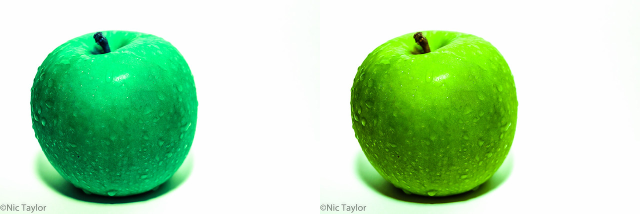

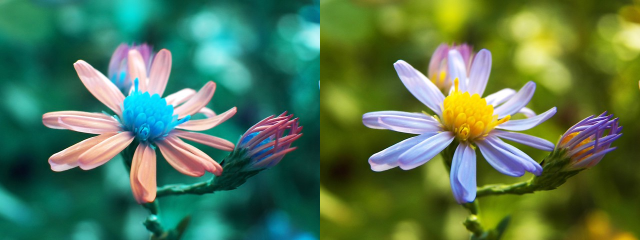

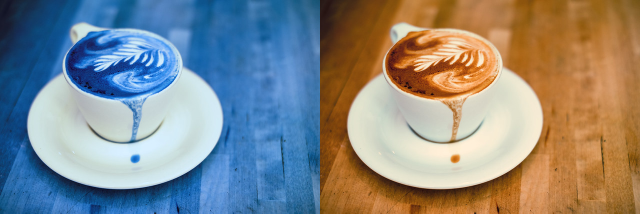

In [45]:

urls = [
    "https://farm8.staticflickr.com/7377/9359257263_81b080a039_z_d.jpg",
    "https://farm9.staticflickr.com/8295/8007075227_dc958c1fe6_z_d.jpg",
    "https://farm4.staticflickr.com/3752/9684880330_9b4698f7cb_z_d.jpg"
]

for url in urls:
  image = io.imread(url)
  image = cv.resize(image, (0,0), fx=0.5, fy=0.5)
  image_2 = cv.cvtColor(image, cv.COLOR_BGR2RGB)
  final_frame = cv.hconcat((image, image_2))
  cv2_imshow(final_frame)
  print('\n')


resolusi image: tinggi x lebar =  214  x  320


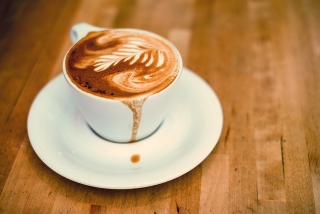

In [46]:
tinggi = image_2.shape[0]
lebar = image_2.shape[1]
print("resolusi image: tinggi x lebar = ", tinggi, " x ", lebar)
cv2_imshow(image_2)

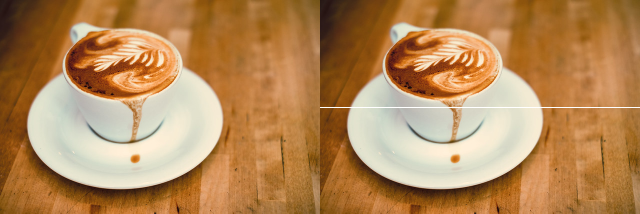

In [47]:
image_2 = cv.cvtColor(image, cv.COLOR_BGR2RGB)
image_3 = cv.cvtColor(image, cv.COLOR_BGR2RGB)

for y in range (lebar):
  image_3[int((tinggi)/2),y] = [255,255,255]

final_frame = cv.hconcat((image_2, image_3))
cv2_imshow(final_frame)

## PERTANYAAN PRAKTIKUM D2

### 1. Mengapa pada modul praktikum ini eksekusi kode Python dilakukan menggunakan Google Colab?
**Jawaban:**
Eksekusi kode Python pada praktikum ini menggunakan Google Colab karena beberapa alasan utama:
1. **Zero Configuration (Siap Pakai):** Tidak memerlukan instalasi Python maupun konfigurasi environment lokal yang rumit di komputer masing-masing mahasiswa, sehingga meminimalisir masalah kompatibilitas sistem operasi (Windows/Linux/macOS) dan konflik versi library.
2. **Pre-installed Libraries:** Google Colab telah menyediakan berbagai library standar pengolahan citra dan data science secara bawaan (seperti NumPy, OpenCV, Pandas, Matplotlib, Scikit-Image, dan PIL).
3. **Hardware Acceleration (GPU/TPU Gratis):** Google Colab menyediakan akses ke GPU dan TPU gratis dari Google berbasis cloud, yang sangat membantu akselerasi komputasi ketika praktikum berkembang ke arah pemrosesan citra tingkat lanjut atau deep learning/computer vision.
4. **Portabilitas dan Kemudahan Berbagi/Kolaborasi:** File notebook tersimpan di cloud (Google Drive) dan terintegrasi langsung dengan GitHub, memudahkan penyimpanan, kolaborasi, serta proses pengumpulan tugas praktikum.

---

### 2. Jelaskan mengenai kegunaan setiap library pada praktikum langkah ke delapan? Apakah semua library tersebut harus digunakan dalam praktikum sesi ini?
**Jawaban:**
Pada praktikum langkah ke-8, library yang di-import adalah:
```python
import numpy as np
import pandas as pd
import cv2 as cv
from google.colab.patches import cv2_imshow
from skimage import io
from skimage import transform
from PIL import Image
import matplotlib.pylab as plt
```

**Kegunaan masing-masing library:**
- **`numpy` (`np`)**: Library dasar untuk komputasi numerik dan manipulasi array multi-dimensi. Dalam visi komputer, citra digital direpresentasikan sebagai matriks (array NumPy) berisi nilai intensitas pixel.
- **`pandas` (`pd`)**: Library untuk manipulasi dan analisis data tabular (DataFrame). Umumnya digunakan untuk mengelola dataset, metadata gambar, atau hasil ekstraksi fitur.
- **`cv2` (`cv`)**: OpenCV (Open Source Computer Vision Library), library utama untuk pemrosesan citra digital dan computer vision (konversi ruang warna, manipulasi geometri, filtering, deteksi objek, dll.).
- **`cv2_imshow`**: Patch khusus dari Google Colab untuk menampilkan citra di output cell notebook. Ini digunakan untuk menggantikan fungsi bawaan `cv2.imshow()` yang dapat menyebabkan Colab *crash* karena ketiadaan GUI X-server pada server cloud Colab.
- **`skimage.io`**: Modul dari library Scikit-Image untuk fungsi input/output citra (membaca, menyimpan, menampilkan). Pada sesi ini digunakan untuk membaca gambar langsung dari URL internet (`io.imread(url)`).
- **`skimage.transform`**: Modul Scikit-Image untuk transformasi geometri pada citra (seperti resize, rescale, rotate, warping, dll.).
- **`PIL.Image` (Pillow)**: Library manipulasi gambar alternatif di Python untuk membuka, memanipulasi, dan menyimpan berbagai format file citra.
- **`matplotlib.pylab` (`plt`)**: Modul untuk plotting dan visualisasi grafik, histogram warna citra, serta penampil citra alternatif.

**Apakah semua library tersebut harus digunakan dalam praktikum sesi ini?**
**Tidak semua.** Library yang secara aktif dipanggil pada praktikum sesi ini (Langkah 9 s.d. 11) hanyalah:
- `skimage.io` (untuk `io.imread(url)`)
- `cv2` (untuk `cv.resize`, `cv.cvtColor`, dan `cv.hconcat`)
- `cv2_imshow` (untuk menampilkan hasil citra gabungan)
Sedangkan `pandas`, `skimage.transform`, `PIL.Image`, dan `matplotlib.pylab` belum digunakan secara langsung pada kode sesi ini, melainkan di-import sebagai persiapan untuk modul/langkah praktikum berikutnya.

---

### 3. Pada uji coba langkah ke-9 terdapat potongan kode program sebagai berikut:
```python
image_2 = cv.cvtColor(image, cv.COLOR_BGR2RGB)
final_frame = cv.hconcat((image, image_2))
cv2_imshow(final_frame)
```
**Apa kegunaan kode program tersebut? Dan apa pengaruhnya jika tidak dilakukan?**
**Jawaban:**
- **Kegunaan kode program:**
  - `cv.cvtColor(image, cv.COLOR_BGR2RGB)`: Berfungsi untuk mengonversi ruang warna citra dari format **BGR (Blue-Green-Red)** ke format **RGB (Red-Green-Blue)**.
  - `cv.hconcat((image, image_2))`: Berfungsi untuk menggabungkan dua matriks citra (`image` asli dan `image_2` hasil konversi) secara horizontal (bersebelahan) ke dalam satu frame.
  - `cv2_imshow(final_frame)`: Berfungsi untuk menampilkan citra gabungan tersebut ke output cell Colab.
- **Pengaruh jika tidak dilakukan:**
  - `skimage.io.imread()` membaca gambar langsung dalam urutan channel **RGB**, sedangkan fungsi-fungsi OpenCV secara default mengasumsikan urutan channel warna adalah **BGR**.
  - Jika konversi `cv.cvtColor()` tidak dilakukan, kita tidak dapat membandingkan perbedaan channel warna antara format BGR dan RGB secara visual.
  - Apabila citra diproses atau disimpan lebih lanjut menggunakan fungsi OpenCV tanpa penyesuaian ruang warna, citra akan mengalami distorsi warna (*color distortion/swap*), di mana warna merah dan biru tertukar (misalnya objek merah tampak biru, atau warna kulit manusia tampak kebiru-biruan).

---

### 4. Perhatikan potongan kode program berikut:
```python
for y in range (lebar):
  image_3[int((tinggi)/2),y] = [255,255,255]
```
**Apakah kegunaan kode [255,255,255] ? Jelaskan!**
**Jawaban:**
- **Kegunaan nilai `[255, 255, 255]`:**
  Nilai `[255, 255, 255]` adalah representasi nilai intensitas warna maksimum untuk ketiga channel warna pada model **RGB** (dengan kedalaman warna 8-bit per channel, rentang 0-255):
  - **Red (Merah) = 255**
  - **Green (Hijau) = 255**
  - **Blue (Biru) = 255**
  Penggabungan intensitas maksimum dari ketiga cahaya primer ini menghasilkan warna **PUTIH** (*pure white*).
- **Penjelasan fungsi dalam potongan kode:**
  Perulangan `for y in range(lebar):` mengakses baris horizontal tepat di tengah citra, yaitu pada indeks baris `int(tinggi / 2)`, lalu mengubah nilai pixel dari kolom `y = 0` hingga `y = lebar - 1` menjadi `[255, 255, 255]`. Tujuannya adalah untuk **menggambar sebuah garis horizontal lurus berwarna putih tepat di tengah-tengah gambar `image_3`**.

---

### 5. Jelaskan keterkaitan antara pixel dan juga resolusi gambar yang tinggi ataupun rendah!
**Jawaban:**
- **Pixel (*Picture Element*):**
  Pixel adalah unit fisik terkecil penyusun gambar digital yang menyimpan nilai intensitas dan informasi warna pada koordinat tertentu `(x, y)`. Kumpulan dari ribuan hingga jutaan pixel yang tersusun dalam baris dan kolom matriks membentuk sebuah citra visual utuh.
- **Resolusi Gambar:**
  Resolusi gambar menunjukkan jumlah total atau kerapatan pixel yang menyusun suatu citra, umumnya dinyatakan dalam format `Tinggi x Lebar` (misal 1080 x 1920) atau total megapixel.
- **Keterkaitan Pixel dengan Resolusi Tinggi dan Rendah:**
  1. **Resolusi Tinggi (*High Resolution*):**
     - Tersusun atas jumlah pixel yang sangat banyak dan rapat.
     - Citra menampilkan detail yang sangat tajam, halus, dan jelas.
     - Gambar tidak mudah pecah (*pixelated*) ketika dilakukan perbesaran (*zoom in*).
     - Membutuhkan kapasitas penyimpanan (*file size*) lebih besar dan beban komputasi lebih tinggi untuk pemrosesannya.
  2. **Resolusi Rendah (*Low Resolution*):**
     - Tersusun atas jumlah pixel yang relatif sedikit.
     - Detail gambar terbatas, tepi objek terlihat kurang tajam atau buram.
     - Jika diperbesar (*zoom in*), kotak-kotak pixel individual akan terlihat jelas (efek *pixelation* / bentuk tangga bergerigi).
     - Ukuran file lebih ringan dan komputasi pemrosesan citra jauh lebih cepat.


## TUGAS PRAKTIKUM D2

### 1. Garis Horisontal Berwarna Putih di Bagian Tengah Gambar


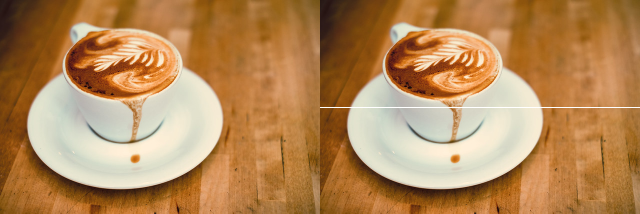

In [48]:
image_2 = cv.cvtColor(image, cv.COLOR_BGR2RGB)
image_3 = cv.cvtColor(image, cv.COLOR_BGR2RGB)

for y in range(lebar):
  image_3[int((tinggi)/2), y] = [255, 255, 255]

final_frame = cv.hconcat((image_2, image_3))
cv2_imshow(final_frame)


### 2. Garis Vertikal dan Garis Menyilang Diagonal pada Image Keluaran
#### a. Garis Vertikal


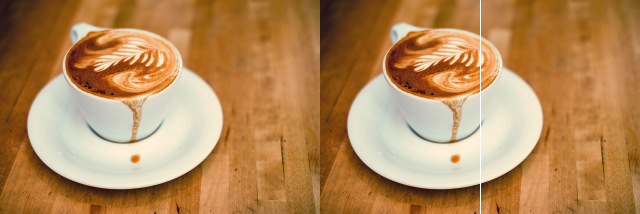

In [49]:
image_2 = cv.cvtColor(image, cv.COLOR_BGR2RGB)
image_3 = cv.cvtColor(image, cv.COLOR_BGR2RGB)

# Membuat garis vertikal di tengah gambar
for x in range(tinggi):
  image_3[x, int(lebar / 2)] = [255, 255, 255]

final_frame = cv.hconcat((image_2, image_3))
cv2_imshow(final_frame)


#### b. Garis Menyilang Diagonal (Huruf X)


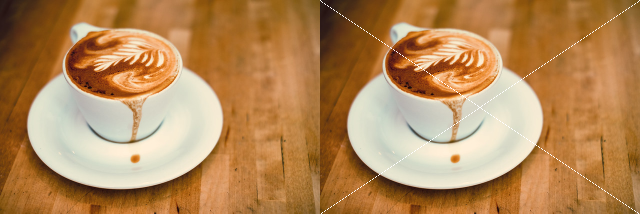

In [50]:
image_2 = cv.cvtColor(image, cv.COLOR_BGR2RGB)
image_3 = cv.cvtColor(image, cv.COLOR_BGR2RGB)

# Membuat garis menyilang diagonal dari sudut ke sudut
for i in range(tinggi):
  col1 = int(i * (lebar / tinggi))
  col2 = (lebar - 1) - col1
  image_3[i, col1] = [255, 255, 255]
  image_3[i, col2] = [255, 255, 255]

final_frame = cv.hconcat((image_2, image_3))
cv2_imshow(final_frame)


### 3. Garis Horisontal Berwarna Putih di Bagian Tengah Gambar dengan Panjang Tertentu


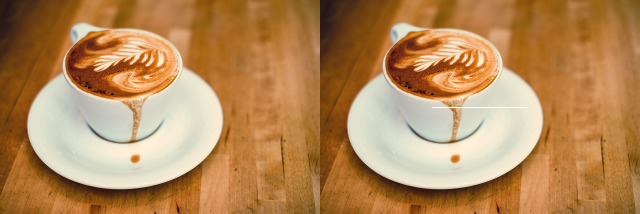

In [51]:
image_2 = cv.cvtColor(image, cv.COLOR_BGR2RGB)
image_3 = cv.cvtColor(image, cv.COLOR_BGR2RGB)

# Menentukan batas panjang garis di bagian tengah (misal: 35% s/d 65% lebar gambar)
start_col = int(lebar * 0.35)
end_col = int(lebar * 0.65)

for y in range(start_col, end_col):
  image_3[int(tinggi / 2), y] = [255, 255, 255]

final_frame = cv.hconcat((image_2, image_3))
cv2_imshow(final_frame)


### 4. Kotak Menggunakan Kumpulan Pixel Warna Putih di Sembarang Tempat dalam Gambar


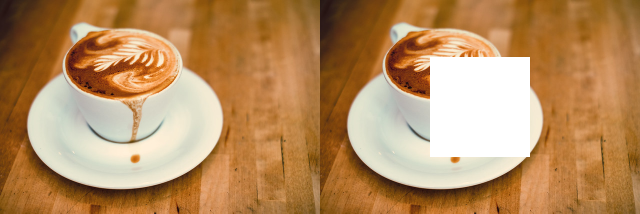

In [52]:
image_2 = cv.cvtColor(image, cv.COLOR_BGR2RGB)
image_3 = cv.cvtColor(image, cv.COLOR_BGR2RGB)

# Menentukan ukuran kotak dan posisi awal (koordinat baris dan kolom)
ukuran_kotak = 100
start_row = int(tinggi / 2) - 50
start_col = int(lebar / 2) - 50

# Mengisi area kotak dengan pixel putih [255, 255, 255]
for i in range(start_row, start_row + ukuran_kotak):
  for j in range(start_col, start_col + ukuran_kotak):
    image_3[i, j] = [255, 255, 255]

final_frame = cv.hconcat((image_2, image_3))
cv2_imshow(final_frame)


In [53]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [54]:
from google.colab import files
uploaded = files.upload()

Saving ktm.jpg to ktm (3).jpg


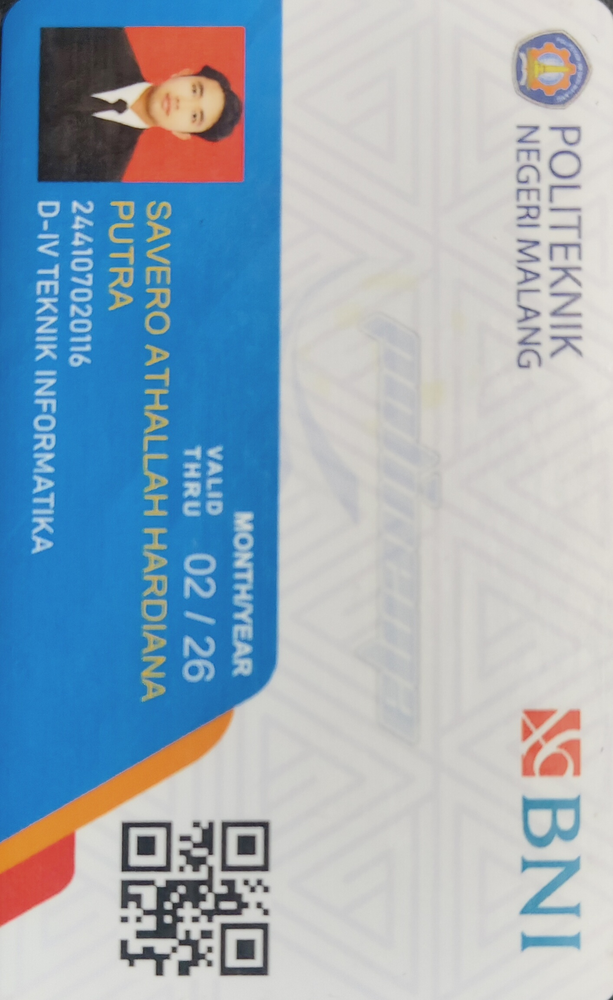

Resolusi gambar: 1412 x 2302


In [55]:
import cv2
from google.colab.patches import cv2_imshow

img = cv2.imread("ktm.jpg")
cv2_imshow(img)

print("Resolusi gambar:", img.shape[1], "x", img.shape[0])

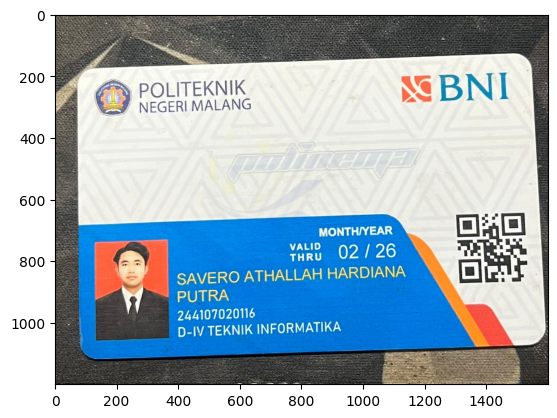

In [56]:
import cv2
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow

img = cv2.imread("/content/drive/MyDrive/berkas/ktm_new.jpg")
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.show()

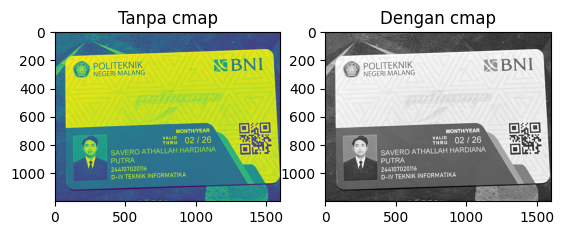

In [57]:
img_gray = cv2.imread("/content/drive/MyDrive/berkas/ktm_new.jpg", cv2.IMREAD_GRAYSCALE)

# Tanpa cmap
plt.subplot(1,2,1)
plt.imshow(img_gray)
plt.title("Tanpa cmap")

# Dengan cmap
plt.subplot(1,2,2)
plt.imshow(img_gray, cmap="gray")
plt.title("Dengan cmap")

plt.show()

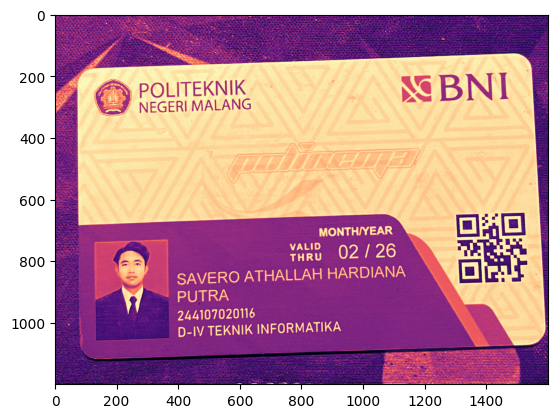

In [58]:
plt.imshow(img_gray, cmap="magma")

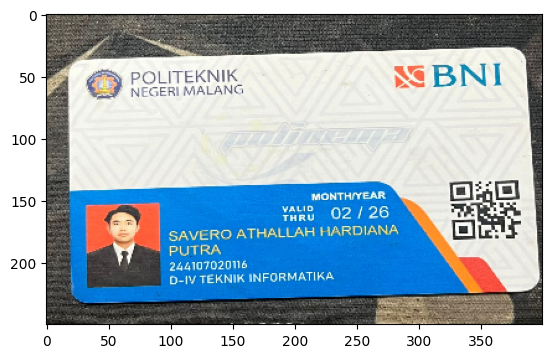

In [59]:
img = cv2.imread("/content/drive/MyDrive/berkas/ktm_new.jpg")
imgRGB=cv2.cvtColor(img, cv2.COLOR_BGR2RGB) #Konversi BGR ke RGB
imgRGBsmall=cv2.resize(imgRGB,(400,250))
plt.imshow(imgRGBsmall)

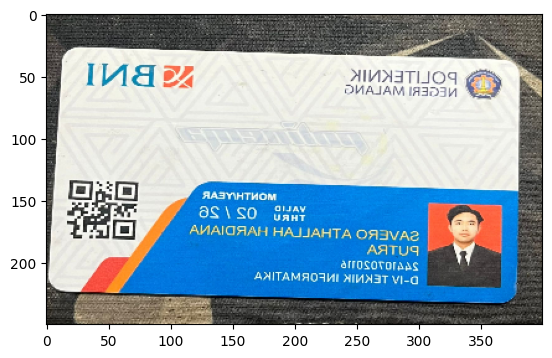

In [60]:
imgBalik=cv2.flip(imgRGBsmall,1)
plt.imshow(imgBalik)

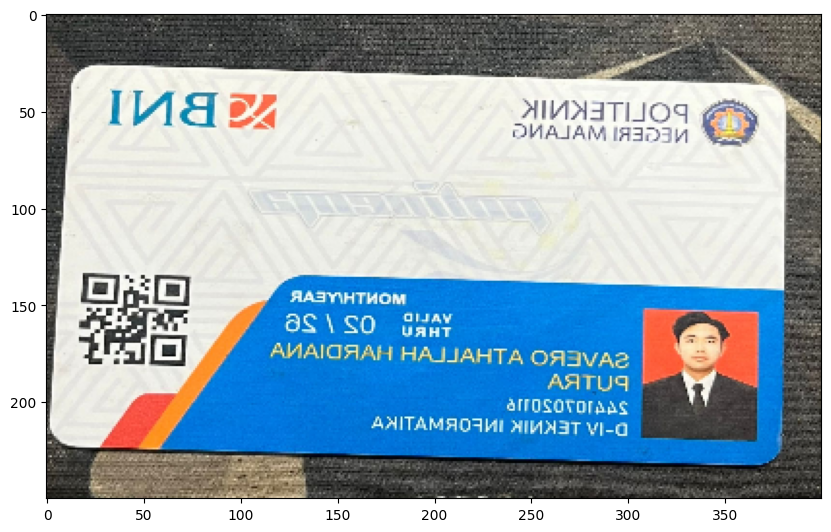

In [61]:
imgBalik=cv2.flip(imgRGBsmall,1)

#tampilkan ukuran canvas yang lebih besar
fig=plt.figure(figsize=(10,10))
ax=fig.add_subplot(111)
ax.imshow(imgBalik)

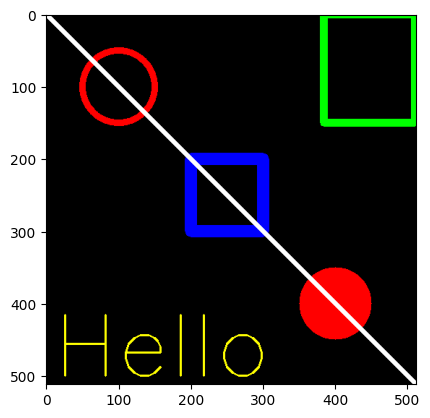

In [62]:
## Membuat bentuk Geometri 2D dari OpenCV
import cv2 as cv
import matplotlib.pyplot as plt
import numpy as np

# Inisialisasi canvas hitam
black_img = np.zeros(shape=(512, 512, 3), dtype=np.int16)

# Persegi panjang hijau & biru
cv.rectangle(black_img, pt1=(384, 0), pt2=(510, 150), color=(0, 255, 0), thickness=10)
cv.rectangle(black_img, pt1=(200, 200), pt2=(300, 300), color=(0, 0, 255), thickness=15)

# Lingkaran merah atas (outline) & bawah (solid)
cv.circle(black_img, center=(100, 100), radius=50, color=(255, 0, 0), thickness=8)
cv.circle(black_img, center=(400, 400), radius=50, color=(255, 0, 0), thickness=-1)

# Garis diagonal putih
cv.line(black_img, pt1=(0, 0), pt2=(512, 512), color=(255, 255, 255), thickness=5)

# Teks "Hello" kuning
font = cv.FONT_HERSHEY_SIMPLEX
cv.putText(black_img, text='Hello', org=(10, 500), fontFace=font, fontScale=4, color=(255, 255, 0), thickness=2, lineType=cv.LINE_AA)

# Tampilkan hasil akhir
plt.imshow(black_img)
plt.show()

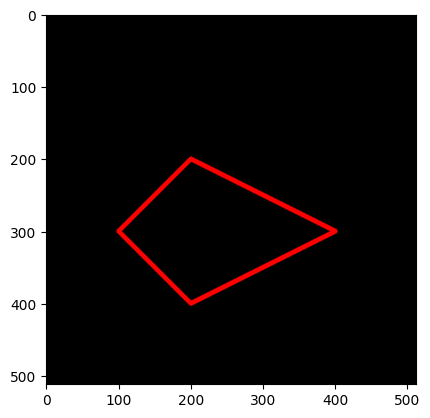

In [63]:
# Inisialisasi canvas hitam
black_img2 = np.zeros(shape=(512, 512, 3), dtype=np.int32)

# Definisikan koordinat titik dan reshape
vertices = np.array([[100, 300], [200, 200], [400, 300], [200, 400]], dtype=np.int32)
pts = vertices.reshape((-1, 1, 2))

# Gambar poligon tertutup berwarna merah
cv.polylines(black_img2, [pts], isClosed=True, color=(255, 0, 0), thickness=5)

# Tampilkan hasil
plt.imshow(black_img2)
plt.show()

## TUGAS PRAKTIKUM BAGIAN 3 & 4

### 1. Pengaruh figsize Terhadap Ukuran Pixel Image
**Jawaban:**
Tidak, penggunaan `figsize` hanya mengubah ukuran kanvas visualisasi pada layar Matplotlib, sedangkan resolusi piksel asli citra (`image.shape`) tetap sama dan tidak mengalami perubahan.

### 2. Menampilkan Image dalam Channel Red-Blue dan Green-Blue Saja

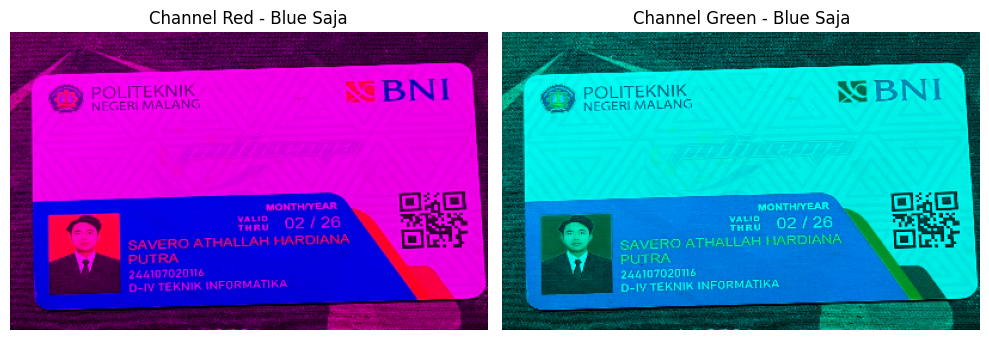

In [64]:
try:
    citra_base = imgRGBsmall.copy()
except NameError:
    citra_base = image_2.copy()

# 1. Channel Red-Blue: Channel Green (indeks 1) di-nolkan
citra_rb = citra_base.copy()
citra_rb[:, :, 1] = 0

# 2. Channel Green-Blue: Channel Red (indeks 0) di-nolkan
citra_gb = citra_base.copy()
citra_gb[:, :, 0] = 0

# Tampilkan hasil
fig, axes = plt.subplots(1, 2, figsize=(10, 5))
axes[0].imshow(citra_rb)
axes[0].set_title("Channel Red - Blue Saja")
axes[0].axis('off')

axes[1].imshow(citra_gb)
axes[1].set_title("Channel Green - Blue Saja")
axes[1].axis('off')

plt.tight_layout()
plt.show()

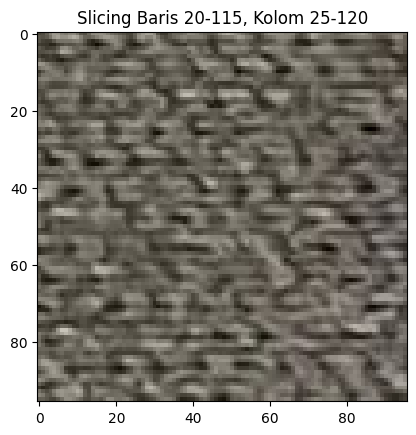

In [65]:
## Soal 3
crop_img = imgRGB[20:116, 25:121]

plt.imshow(crop_img)
plt.title("Slicing Baris 20-115, Kolom 25-120")
plt.show()

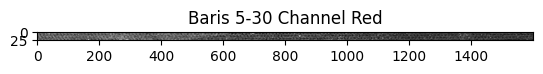

In [66]:
## Soal 4

crop_red = imgRGB[5:31, :, 0]

plt.imshow(crop_red, cmap="gray")
plt.title("Baris 5-30 Channel Red")
plt.show()

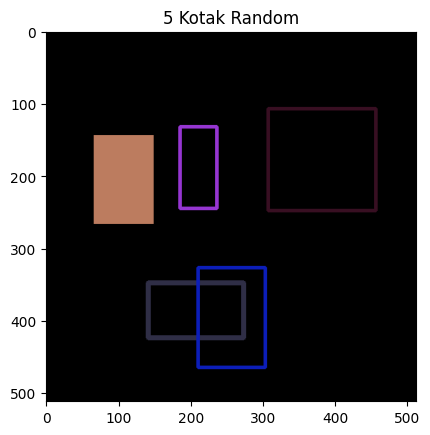

In [67]:
## Soal 5
# Buat canvas hitam ukuran 512x512
canvas = np.zeros((512, 512, 3), dtype=np.uint8)

# Buat 5 kotak random
for _ in range(5):
    pt1 = (np.random.randint(0, 350), np.random.randint(0, 350))
    pt2 = (pt1[0] + np.random.randint(50, 150), pt1[1] + np.random.randint(50, 150))
    color = (int(np.random.randint(0, 256)), int(np.random.randint(0, 256)), int(np.random.randint(0, 256)))
    thickness = np.random.choice([-1, 2, 4, 6])
    cv2.rectangle(canvas, pt1, pt2, color, thickness)

plt.imshow(canvas)
plt.title("5 Kotak Random")
plt.show()

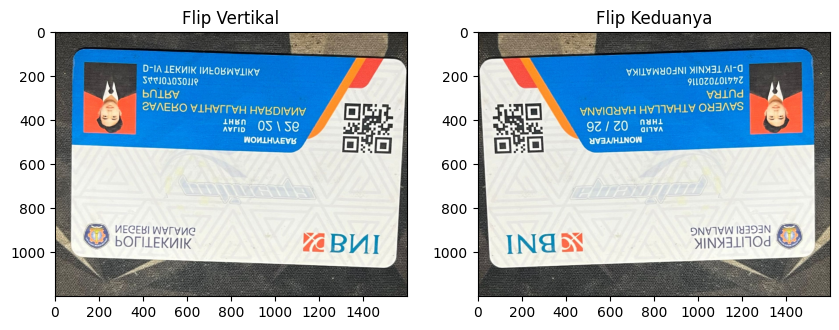

In [68]:
## Soal 6
# Balik vertikal (atas-bawah)
img_flip_vertical = cv2.flip(imgRGB, 0)

# Balik horizontal dan vertikal
img_flip_both = cv2.flip(imgRGB, -1)

plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(img_flip_vertical)
plt.title("Flip Vertikal")

plt.subplot(1, 2, 2)
plt.imshow(img_flip_both)
plt.title("Flip Keduanya")
plt.show()

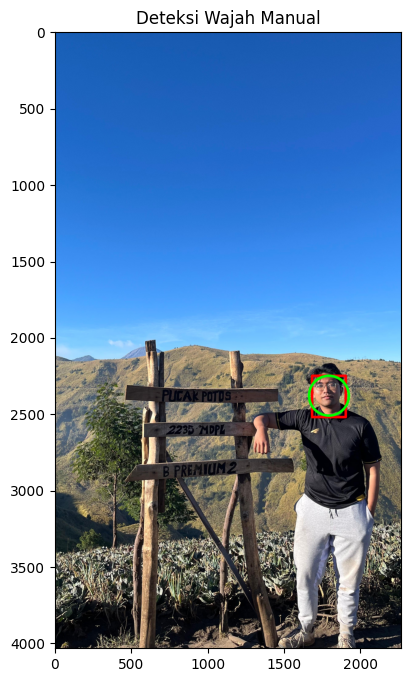

In [79]:
## Soal 7
# Load foto aktivitas
foto = cv2.imread("/content/drive/MyDrive/berkas/foto_aktivitas.jpg")
foto_rgb = cv2.cvtColor(foto, cv2.COLOR_BGR2RGB)

cv2.rectangle(foto_rgb, pt1=(1680, 2250), pt2=(1900, 2520), color=(255, 0, 0), thickness=15)
cv2.circle(foto_rgb, center=(1790, 2380), radius=130, color=(0, 255, 0), thickness=15)

plt.figure(figsize=(8, 8))
plt.imshow(foto_rgb)
plt.title("Deteksi Wajah Manual")
plt.show()

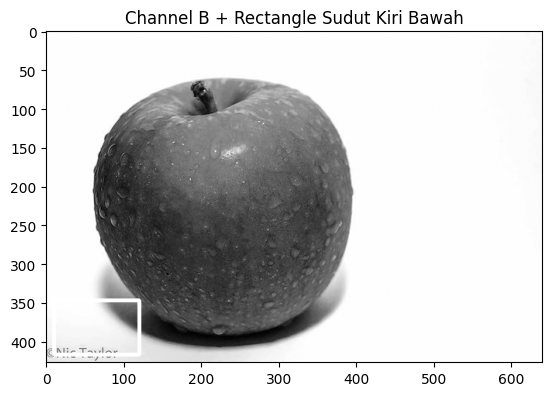

In [72]:
# Load citra standard lena/mandrill/peppers
img_std = io.imread("https://farm8.staticflickr.com/7377/9359257263_81b080a039_z_d.jpg")
img_std_rgb = cv2.cvtColor(img_std, cv2.COLOR_BGR2RGB)

# Pisahkan ke channel Blue saja
b_channel = img_std_rgb[:, :, 2].copy()

# Buat rectangle di sudut kiri bawah
h, w = b_channel.shape
cv2.rectangle(b_channel, pt1=(10, h - 80), pt2=(120, h - 10), color=255, thickness=4)

plt.imshow(b_channel, cmap="gray")
plt.title("Channel B + Rectangle Sudut Kiri Bawah")
plt.show()

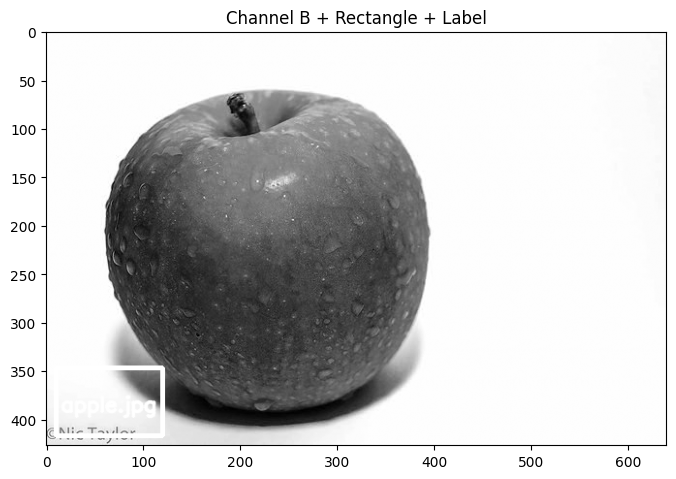

In [73]:
# Tambahkan teks nama file ke citra nomor 8
font = cv2.FONT_HERSHEY_SIMPLEX
cv2.putText(b_channel, text="apple.jpg", org=(15, h - 35), fontFace=font, fontScale=0.7, color=255, thickness=2, lineType=cv2.LINE_AA)

plt.figure(figsize=(8, 8))
plt.imshow(b_channel, cmap="gray")
plt.title("Channel B + Rectangle + Label")
plt.show()

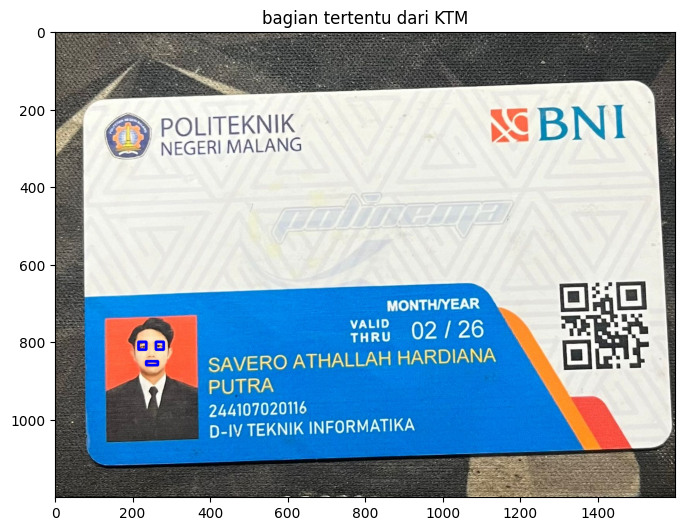

In [96]:
## TUGAS PRAKTIKUM KELOMPOK
img = cv2.imread("/content/drive/MyDrive/berkas/ktm_new.jpg")


cv2.rectangle(img, pt1=(215, 800), pt2=(235, 820), color=(255, 0, 0), thickness=5)
cv2.rectangle(img, pt1=(260, 800), pt2=(280, 820), color=(255, 0, 0), thickness=5)
cv2.rectangle(img, pt1=(235, 850), pt2=(265, 860), color=(255, 0, 0), thickness=5)


plt.figure(figsize=(8, 8))
plt.imshow(img)
plt.title("bagian tertentu dari KTM")
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.show()
